In [195]:
import torch
import math
import numpy as np
from torch import nn
import random
import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px
import chart_studio.tools as tls
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import pandas as pd
import copy 
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation
from celluloid import Camera
import time
import torchvision
import torch.nn.functional as F
from torchsummary import summary
from torch.autograd import Variable
from sklearn.datasets import load_breast_cancer
import seaborn as sns
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler


https://www.kaggle.com/uciml/breast-cancer-wisconsin-data/notebooks?datasetId=180&sortBy=voteCount 

In [3]:
data = load_breast_cancer()
data.DESCR
#data

'.. _breast_cancer_dataset:\n\nBreast cancer wisconsin (diagnostic) dataset\n--------------------------------------------\n\n**Data Set Characteristics:**\n\n    :Number of Instances: 569\n\n    :Number of Attributes: 30 numeric, predictive attributes and the class\n\n    :Attribute Information:\n        - radius (mean of distances from center to points on the perimeter)\n        - texture (standard deviation of gray-scale values)\n        - perimeter\n        - area\n        - smoothness (local variation in radius lengths)\n        - compactness (perimeter^2 / area - 1.0)\n        - concavity (severity of concave portions of the contour)\n        - concave points (number of concave portions of the contour)\n        - symmetry \n        - fractal dimension ("coastline approximation" - 1)\n\n        The mean, standard error, and "worst" or largest (mean of the three\n        largest values) of these features were computed for each image,\n        resulting in 30 features.  For instance,

Get To know the Data

In [4]:
# Convert to data frame for easier use
features = list(data.feature_names)
features.append('target')
df = pd.DataFrame(data= np.c_[data['data'], data['target']],
                     columns= features)
df

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,0.0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,0.0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,0.0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,0.0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,0.0
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,0.0
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,0.0
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,0.0


In [5]:
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.627417
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,1.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


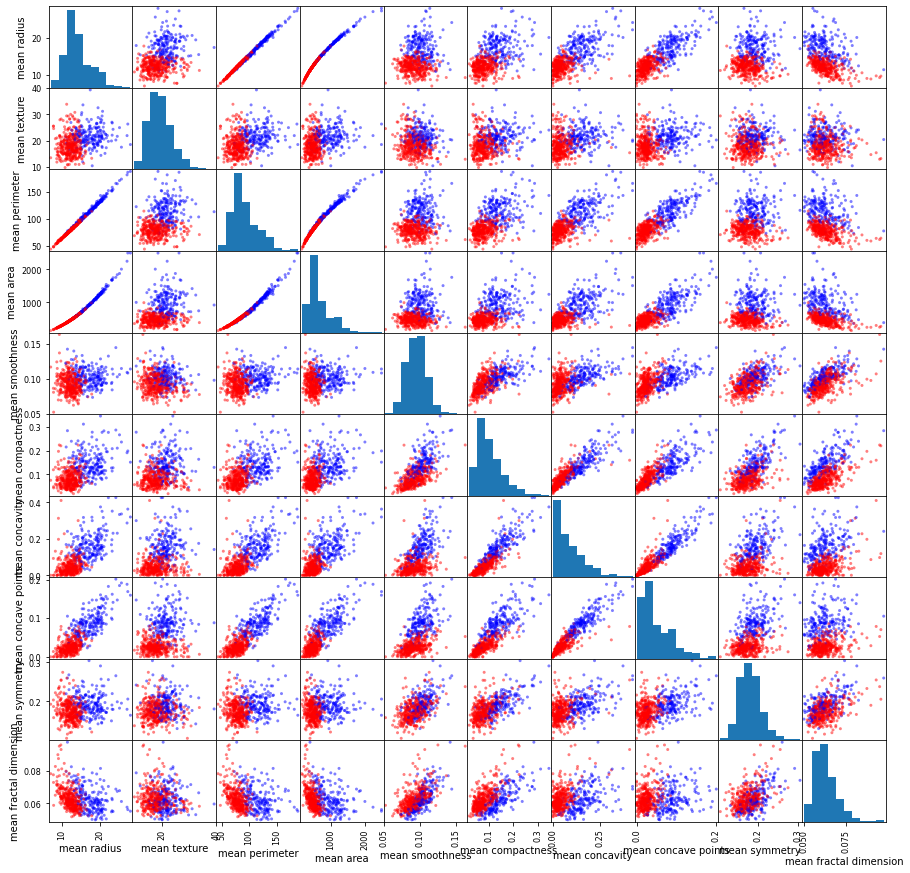

In [6]:
color_map = {0: "blue", 1: "red"}
colors = df["target"].map(lambda x: color_map.get(x))
scatter_matrix(df.iloc[:,0:10], c=colors, alpha = 0.5, figsize = (15, 15))
plt.show()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension
0,1.096100,-2.071512,1.268817,0.983510,1.567087,3.280628,2.650542,2.530249,2.215566,2.253764
1,1.828212,-0.353322,1.684473,1.907030,-0.826235,-0.486643,-0.023825,0.547662,0.001391,-0.867889
2,1.578499,0.455786,1.565126,1.557513,0.941382,1.052000,1.362280,2.035440,0.938859,-0.397658
3,-0.768233,0.253509,-0.592166,-0.763792,3.280667,3.399917,1.914213,1.450431,2.864862,4.906602
4,1.748758,-1.150804,1.775011,1.824624,0.280125,0.538866,1.369806,1.427237,-0.009552,-0.561956
...,...,...,...,...,...,...,...,...,...,...
564,2.109139,0.720838,2.058974,2.341795,1.040926,0.218868,1.945573,2.318924,-0.312314,-0.930209
565,1.703356,2.083301,1.614511,1.722326,0.102368,-0.017817,0.692434,1.262558,-0.217473,-1.057681
566,0.701667,2.043775,0.672084,0.577445,-0.839745,-0.038646,0.046547,0.105684,-0.808406,-0.894800
567,1.836725,2.334403,1.980781,1.733693,1.524426,3.269267,3.294046,2.656528,2.135315,1.042778


In [125]:
#Grab the first 10 features
features = df.iloc[:,0:30]
y = df.target
#Normalize the data
data_n_2 = (features -features.mean())/ (features.std())
data = pd.concat([y,data_n_2],axis=1)
data = pd.melt(data,id_vars="target",
                    var_name="features",
                    value_name='value')
data

,target,features,value
0,0.0,mean radius,1.096100
1,0.0,mean radius,1.828212
2,0.0,mean radius,1.578499
3,0.0,mean radius,-0.768233
4,0.0,mean radius,1.748758
...,...,...,...
17065,0.0,worst fractal dimension,-0.708467
17066,0.0,worst fractal dimension,-0.973122
17067,0.0,worst fractal dimension,-0.318129
17068,0.0,worst fractal dimension,2.217684


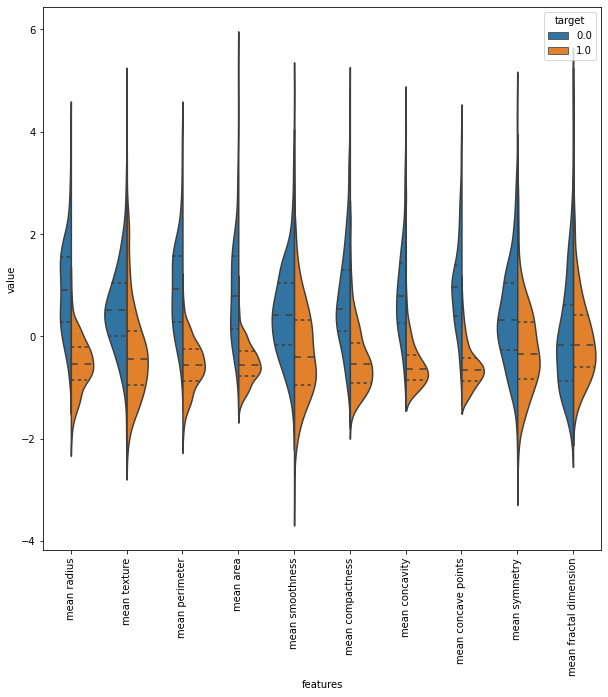

In [8]:
plt.figure(figsize=(10,10))
sns.violinplot(x="features", y="value", hue="target", data=data,split=True, inner="quart")
plt.xticks(rotation=90)
plt.show()


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 <a list of 10 Text major ticklabel objects>)

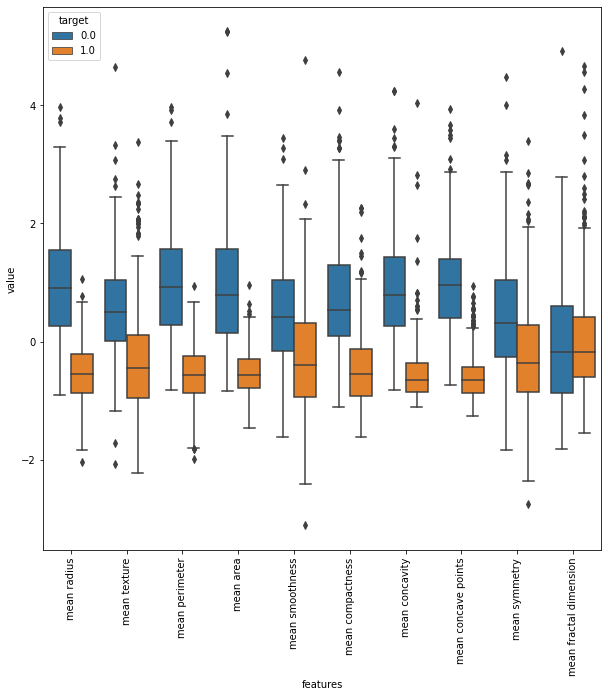

In [9]:
plt.figure(figsize=(10,10))
sns.boxplot(x="features", y="value", hue="target", data=data)
plt.xticks(rotation=90)

# Create NN

In [183]:
class FullyConnectNet(nn.Module):
    def __init__(self):
        super(FullyConnectNet, self).__init__()
        self.fc = nn.Sequential(
            nn.Linear(30,60),
            nn.ReLU(),
            nn.Linear(60,60),
            nn.ReLU(),
            nn.Linear(60,1),
        )
    def forward(self,x):
        return self.fc(x)



In [184]:
fully_connected = FullyConnectNet()
fully_connected

FullyConnectNet(
  (fc): Sequential(
    (0): Linear(in_features=30, out_features=60, bias=True)
    (1): ReLU()
    (2): Linear(in_features=60, out_features=60, bias=True)
    (3): ReLU()
    (4): Linear(in_features=60, out_features=1, bias=True)
  )
)

## Convert data to tensors

In [226]:
features = df.iloc[:,0:30]
target = df['target']

training_size = round(.9*len(target.values))
train_features = features[:training_size]
test_features = features[training_size:]
train_target = target[:training_size]
test_target = target[training_size:]

#test_features

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
512,13.400,20.52,88.64,556.7,0.11060,0.14690,0.144500,0.081720,0.2116,0.07325,...,16.410,29.66,113.30,844.4,0.15740,0.38560,0.51060,0.20510,0.3585,0.11090
513,14.580,13.66,94.29,658.8,0.09832,0.08918,0.082220,0.043490,0.1739,0.05640,...,16.760,17.24,108.50,862.0,0.12230,0.19280,0.24920,0.09186,0.2626,0.07048
514,15.050,19.07,97.26,701.9,0.09215,0.08597,0.074860,0.043350,0.1561,0.05915,...,17.580,28.06,113.80,967.0,0.12460,0.21010,0.28660,0.11200,0.2282,0.06954
515,11.340,18.61,72.76,391.2,0.10490,0.08499,0.043020,0.025940,0.1927,0.06211,...,12.470,23.03,79.15,478.6,0.14830,0.15740,0.16240,0.08542,0.3060,0.06783
516,18.310,20.58,120.80,1052.0,0.10680,0.12480,0.156900,0.094510,0.1860,0.05941,...,21.860,26.20,142.20,1493.0,0.14920,0.25360,0.37590,0.15100,0.3074,0.07863
517,19.890,20.26,130.50,1214.0,0.10370,0.13100,0.141100,0.094310,0.1802,0.06188,...,23.730,25.23,160.50,1646.0,0.14170,0.33090,0.41850,0.16130,0.2549,0.09136
518,12.880,18.22,84.45,493.1,0.12180,0.16610,0.048250,0.053030,0.1709,0.07253,...,15.050,24.37,99.31,674.7,0.14560,0.29610,0.12460,0.10960,0.2582,0.08893
519,12.750,16.70,82.51,493.8,0.11250,0.11170,0.038800,0.029950,0.2120,0.06623,...,14.450,21.74,93.63,624.1,0.14750,0.19790,0.14230,0.08045,0.3071,0.08557
520,9.295,13.90,59.96,257.8,0.13710,0.12250,0.033320,0.024210,0.2197,0.07696,...,10.570,17.84,67.84,326.6,0.18500,0.20970,0.09996,0.07262,0.3681,0.08982
521,24.630,21.60,165.50,1841.0,0.10300,0.21060,0.231000,0.147100,0.1991,0.06739,...,29.920,26.93,205.70,2642.0,0.13420,0.41880,0.46580,0.24750,0.3157,0.09671


In [280]:
device = torch.device("cuda")
data = load_breast_cancer()
X, Y = data.data, data.target

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)

scaler = StandardScaler()
x_train_tensor = scaler.fit_transform(X_train)
x_test_tensor = scaler.transform(X_test)

x_train_tensor = torch.from_numpy(X_train.astype(np.float32))
x_test_tensor = torch.from_numpy(X_test.astype(np.float32))
y_train_tensor = torch.from_numpy(y_train.astype(np.float32)).reshape(-1, 1)
y_test_tensor = torch.from_numpy(y_test.astype(np.float32)).reshape(-1, 1)

x_test_tensor = x_test_tensor.to(device=device)
x_train_tensor = x_train_tensor.to(device=device)
y_train_tensor = y_train_tensor.to(device=device)
y_test_tensor = y_test_tensor.to(device=device)
#x_train_tensor = torch.tensor(X_train, requires_grad=True, device = device)
#y_train_tensor = torch.tensor(train_target.values, requires_grad=False, device = device)

#x_test_tensor = torch.tensor(X_test, requires_grad=True, device = device)
#y_test_tensor = torch.tensor(test_target.values, requires_grad=False, device = device)

#y_test_tensor

## Create Training Loop

In [288]:
fully_connected = FullyConnectNet()
#fully_connected = torch.nn.Linear(30, 1)
epochs = 2000
learning_rate = 0.1

fully_connected.train()
fully_connected.cuda()

optimizer = torch.optim.Adam(fully_connected.parameters())
criterion = torch.nn.BCEWithLogitsLoss()



start = time.time()
loss_history = []

for epoch in range(epochs):
    #Forward Pass
    y_pred = fully_connected(x_train_tensor)
    #Calculate Loss
    loss = criterion(y_pred, y_train_tensor)
    loss_history.append(loss.item())

    #Back Prop
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
end = time.time()
total = end-start
print("Model took " + str(total) + " with final loss of " + str(loss.item()))


Model took 7.560999870300293 with final loss of 0.046050265431404114


In [289]:
x = np.arange(len(loss_history))
fig = go.Figure(data=go.Scatter(x=x, y=loss_history))
fig.show()

In [290]:
fully_connected.eval()
with torch.no_grad():
    # Make our predictions
    y_pred = fully_connected(x_train_tensor)
    #Convert to 1 and 0 for classification
    y_pred = (y_pred.cpu().numpy()>0)
    train_acc = np.mean(y_pred == y_train_tensor.cpu().numpy())

    # Make our predictions
    y_pred = fully_connected(x_test_tensor)
    #Convert to 1 and 0 for classification
    y_pred = (y_pred.cpu().numpy()>0)
    test_acc = np.mean(y_pred == y_test_tensor.cpu().numpy())

print(train_acc)
print(test_acc)


0.9846153846153847
0.9824561403508771


array([[False],
       [ True],
       [ True],
       [ True],
       [False],
       [False],
       [ True],
       [ True],
       [ True],
       [False]])

tensor([0., 1., 0., 1., 0., 0., 1., 1., 1., 0.], device='cuda:0',
       dtype=torch.float64)

57